In [ ]:
import numpy as np
import pandas as pd

import os
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from sklearn.linear_model import LinearRegression

#### Detección de rostros

In [ ]:
### Detección de rostros con mediapipe
mp_face_detection= mp.solutions.face_detection
mp_drawing = mp.solutions.drawing_utils

def face_detection(im_name):
    with mp_face_detection.FaceDetection(
        min_detection_confidence=0.5) as face_detection:
        image = cv2.imread(im_name)
        height, width, _ = image.shape
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

        #print('Detections:', results.detections)
        coord=[]
        if results.detections is not None:
            for detection in results.detections:
                # Bounding Box
                xmin = int(round(int(detection.location_data.relative_bounding_box.xmin * width) * 0.75, 0))
                ymin = int(round(int(detection.location_data.relative_bounding_box.ymin * height) * 0.5, 0))
                w = int(round(int(detection.location_data.relative_bounding_box.width * width) * 2, 0))
                h = int(round(int(detection.location_data.relative_bounding_box.height * height) * 1.75, 0))
                
                #xmin = int(detection.location_data.relative_bounding_box.xmin * width)
                #ymin = int(detection.location_data.relative_bounding_box.ymin * height)
                #w = int(detection.location_data.relative_bounding_box.width * width)
                #h = int(detection.location_data.relative_bounding_box.height * height)
                #cv2.rectangle(image, (xmin, ymin), (xmin+w, ymin+h), (0,255,0), 3)
                #coord.append([xmin, ymin, w, h])
                
                coord.extend([xmin, ymin, w, h])

        '''# Dibujar los resultados con MediaPipe
        if results.detections is not None:
            for detection in results.detections:
                mp_drawing.draw_detection(image, detection,
                mp_drawing.DrawingSpec(color=(0,0,255), thickness=3, circle_radius=3),
                mp_drawing.DrawingSpec(color=(0,255,0), thickness=2))
        '''

        #cv2.imshow("Image", image)
        #cv2.waitKey(0)
    #cv2.destroyAllWindows()
    return coord, image

In [ ]:
#imagenes=[]
#for i in range(len(os.listdir(os.path.join(os.getcwd(), os.listdir()[1])))):
    #for j in range(len(os.listdir(os.path.join(os.getcwd(), os.listdir()[1], os.listdir(os.path.join(os.getcwd(), os.listdir()[1]))[i])))):
        #imagenes.append(os.path.join(os.getcwd(), os.listdir()[1], os.listdir(os.path.join(os.getcwd(), os.listdir()[1]))[i], os.listdir(os.path.join(os.getcwd(), os.listdir()[1], os.listdir(os.path.join(os.getcwd(), os.listdir()[1]))[i]))[j]))
    
#for imagen in imagenes:
    #os.rename(imagen, imagen[:imagen.rfind('bd')+3]+imagen[78:].replace('\\','_'))

In [ ]:
### Detección de rostros imágenes candidatos
os.chdir(os.path.join(os.getcwd(), os.listdir()[1]))
imagenes = os.listdir(); img=[]
for imagen in imagenes:
    coord, image = face_detection(imagen)
    try:
        image = image[coord[1]:coord[1]+coord[3],coord[0]:coord[0]+coord[2],:]
        img.append(image)
    except:
        imagenes.remove(imagen)
        print(imagen)

#### Preprocesamiento

In [ ]:
### Normalización, transformación de las imágenes
img = [cv2.resize((cv2.cvtColor(i,cv2.COLOR_BGR2GRAY)/255),[208,208]) for i in img]

data_predict  = {'X':img}
data_predict['X'] = np.array(data_predict['X'])
data_predict['X'] = data_predict['X'].reshape(data_predict['X'].shape[0], 208, 208, 1)

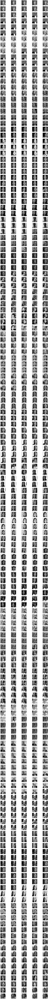

In [ ]:
plt.figure(figsize=(20,400))
for i in range(830):
    plt.subplot(166,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(data_predict['X'][i].reshape(208,208), cmap='gray')

#### Predicción

In [ ]:
### Cargar modelos
os.chdir('..')
#model_cnn=keras.models.load_model('cnn.h5')
model_lstm=keras.models.load_model('lstm.h5')

In [ ]:
### Predicción de rasgos
#cnn_predict = model_cnn.predict(data_predict['X'])
lstm_predict = model_lstm.predict(data_predict['X'])
len(imagenes), lstm_predict.shape

26/26 [==============================] - 3s 75ms/step


(832, (832, 5))

In [ ]:
idx = [imagen[:imagen.index('_')-1].capitalize() for imagen in imagenes]
video = [imagen[:imagen.index('_')].capitalize() for imagen in imagenes]
df = pd.DataFrame(list(zip(idx, video, imagenes, lstm_predict[:,0], lstm_predict[:,1], lstm_predict[:,2], lstm_predict[:,3], lstm_predict[:,4])),
                  columns = ['Candidato', 'Video','img','O_prediction','C_prediction','E_prediction','A_prediction','N_prediction'])
df.to_csv('db_ocean.csv', encoding='utf-8', index=False)
df.shape

(832, 8)

In [ ]:
df.groupby('Candidato').mean()

,O_prediction,C_prediction,E_prediction,A_prediction,N_prediction
Candidato,,,,,
Abinader,0.518190,0.535932,0.407806,0.512950,0.496145
Arauz,0.562229,0.527247,0.461713,0.549647,0.519373
Castro,0.559453,0.520712,0.462854,0.543650,0.513333
Chinchilla,0.581465,0.538549,0.487173,0.551482,0.527421
Fujimori,0.586337,0.531041,0.490721,0.548073,0.525164
Lescano,0.550231,0.495595,0.447284,0.535371,0.493952
Lopez,0.548590,0.537067,0.442771,0.546536,0.512482
Mendoza,0.574979,0.517108,0.478489,0.548698,0.518849


In [ ]:
df.groupby('Video').mean()

,O_prediction,C_prediction,E_prediction,A_prediction,N_prediction
Video,,,,,
Abinader1,0.535132,0.509008,0.436302,0.522644,0.490759
Abinader2,0.423300,0.515727,0.299422,0.430477,0.437798
Abinader3,0.593081,0.550659,0.494537,0.562779,0.542483
Abinader4,0.430036,0.530430,0.303112,0.434561,0.449667
Abinader5,0.572342,0.541734,0.470089,0.554800,0.524992
Abinader6,0.544970,0.494773,0.441377,0.532531,0.492939
Abinader7,0.551117,0.621163,0.436756,0.580928,0.550868
Arauz1,0.579772,0.596838,0.480608,0.569020,0.554598
Arauz2,0.582523,0.500092,0.479346,0.538750,0.514185


___